

---



##Upload data and checkpoint zip files and extract them

In [ ]:
import gdown
# Subset dataset of the original GRID dataset containing 500 Samples of a person saying a sentence and alignments describing what he says
gdown.extractall('data.zip')
# Since the model takes long to train checkpoints have been implemented to save the model weights and use it after.
gdown.extractall('checkpoints.zip', 'models')

['data/',
 'data/alignments/',
 'data/alignments/s1/',
 'data/alignments/s1/bbaf2n.align',
 'data/alignments/s1/bbaf3s.align',
 'data/alignments/s1/bbaf4p.align',
 'data/alignments/s1/bbaf5a.align',
 'data/alignments/s1/bbal6n.align',
 'data/alignments/s1/bbal7s.align',
 'data/alignments/s1/bbal8p.align',
 'data/alignments/s1/bbal9a.align',
 'data/alignments/s1/bbas1s.align',
 'data/alignments/s1/bbas2p.align',
 'data/alignments/s1/bbas3a.align',
 'data/alignments/s1/bbaszn.align',
 'data/alignments/s1/bbaz4n.align',
 'data/alignments/s1/bbaz5s.align',
 'data/alignments/s1/bbaz6p.align',
 'data/alignments/s1/bbaz7a.align',
 'data/alignments/s1/bbbf6n.align',
 'data/alignments/s1/bbbf7s.align',
 'data/alignments/s1/bbbf8p.align',
 'data/alignments/s1/bbbf9a.align',
 'data/alignments/s1/bbbm1s.align',
 'data/alignments/s1/bbbm2p.align',
 'data/alignments/s1/bbbm3a.align',
 'data/alignments/s1/bbbmzn.align',
 'data/alignments/s1/bbbs4n.align',
 'data/alignments/s1/bbbs5s.align',
 'data/al

#Original Model
###Will take longer to load if needed to evaluate try model loaded from checkpoints in the next cell

In [ ]:
import os
import numpy as np
import cv2
import imageio
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv3D, LSTM, Dense, Dropout, MaxPool3D, Activation, Reshape, SpatialDropout3D,
    BatchNormalization, TimeDistributed, Flatten, LeakyReLU, Bidirectional
)
from tensorflow.keras.initializers import HeNormal, GlorotUniform, GlorotNormal
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, Callback
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2


physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print(e)

tf.config.list_physical_devices('GPU')





# Assuming this setup for the vocabulary
vocab = [x for x in "abcdefghijklmnopqrstuvwxyz'?!123456789 "]
char_to_num = tf.keras.layers.StringLookup(vocabulary=vocab, oov_token="")
num_to_char = tf.keras.layers.StringLookup(vocabulary=char_to_num.get_vocabulary(), oov_token="", invert=True)

# Set the directory for alignment files
ALIGNMENTS_DIR = '/content/data/alignments/s1'
DATA_DIR = '/content/data/s1'  # Modify as per your directory structure

def load_data(video_file_path: str, alignment_file_path: str):
    # Convert tensors to strings
    video_file_path = video_file_path.numpy().decode('utf-8')
    alignment_file_path = alignment_file_path.numpy().decode('utf-8')

    # Paths for video and alignment files
    video_full_path = os.path.join(DATA_DIR, video_file_path)
    alignment_full_path = os.path.join(ALIGNMENTS_DIR, alignment_file_path)

    # Initialize video capture
    video_capture = cv2.VideoCapture(video_full_path)
    video_frames = []
    total_frames = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))

    # Process each frame
    for _ in range(total_frames):
        success, frame = video_capture.read()
        if not success:
            break  # Exit loop if no frame is returned
        frame = tf.image.rgb_to_grayscale(frame)
        #cropped_frame = frame[195:241#, 80:220, :]  # framecrop
        #cropped_frame = frame[170:216, 120:260, :]
        video_frames.append(cropped_frame)
    video_capture.release()

    # Calculate frame statistics and normalize
    frames_mean = tf.math.reduce_mean(video_frames)
    frames_std = tf.math.reduce_std(tf.cast(video_frames, tf.float32))
    normalized_frames = tf.cast((video_frames - frames_mean), tf.float32) / frames_std

    # Load and process alignments
    alignment_tokens = []
    with open(alignment_full_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts and parts[2] != 'sil':
                alignment_tokens.extend(' ' + parts[2])
    alignment_tensor = tf.strings.unicode_split(''.join(alignment_tokens), 'UTF-8')
    processed_alignments = char_to_num(alignment_tensor)

    return normalized_frames, processed_alignments



video_files = tf.data.Dataset.list_files(os.path.join(DATA_DIR, '*.mpg'), shuffle=False)
alignment_files = tf.data.Dataset.list_files(os.path.join(ALIGNMENTS_DIR, '*.align'), shuffle=False)


def mappable_function(video_path, alignment_path):
    result = tf.py_function(func=load_data, inp=[video_path, alignment_path], Tout=[tf.float32, tf.int64])
    return result



data = tf.data.Dataset.zip((video_files, alignment_files))
data = data.shuffle(500, reshuffle_each_iteration=False)
data = data.map(mappable_function)
data = data.padded_batch(2, padded_shapes=([75,None,None,None],[40]))
data = data.prefetch(tf.data.AUTOTUNE)

# Added for split
train = data.take(450)
test = data.skip(450)

print(len(test))
print(len(train))


class CustomCallback(Callback):
    def __init__(self, test_dataset, checkpoint_dir, initial_lr=0.0001, decay_start_epoch=30):
        super().__init__()
        self.test_dataset = test_dataset.as_numpy_iterator()
        self.checkpoint_dir = checkpoint_dir
        self.initial_lr = initial_lr
        self.decay_start_epoch = decay_start_epoch
        self.best_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        # Adjust the learning rate after a certain number of epochs
        if epoch >= self.decay_start_epoch:
            new_lr = self.model.optimizer.lr * tf.math.exp(-0.1)
            self.model.optimizer.lr.assign(new_lr)

        # Save the model checkpoint if there is an improvement in the loss
        current_loss = logs.get('loss')
        if current_loss < self.best_loss:
            self.best_loss = current_loss
            self.model.save_weights(os.path.join(self.checkpoint_dir, f'checkpoint_epoch_{epoch}'))

        # Check if there are any data left in the iterator; if not, recreate it
        try:
            data = self.test_dataset.next()
        except StopIteration:
            self.test_dataset = self.test_dataset.dataset.as_numpy_iterator()
            data = self.test_dataset.next()

        # Predict using the current model state
        yhat = self.model.predict(data[0])

        # Decode the predictions using CTC decoder
        decoded, _ = tf.keras.backend.ctc_decode(yhat, input_length=tf.fill([tf.shape(yhat)[0]], 75), greedy=False)
        decoded = decoded[0].numpy()

        # Iterate through batch samples
        for original, pred in zip(data[1], decoded):
            original_text = tf.strings.reduce_join(num_to_char(original)).numpy().decode('utf-8')
            predicted_text = tf.strings.reduce_join(num_to_char(pred)).numpy().decode('utf-8')

            # Print original and predicted results
            print(f'Original: {original_text}')
            print(f'Prediction: {predicted_text}')
            print('~' * 100)

def CTCLoss(y_true, y_pred):
    batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
    input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
    label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

    input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
    label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")

    loss = tf.keras.backend.ctc_batch_cost(y_true, y_pred, input_length, label_length)
    return loss


model = Sequential([
    Conv3D(128, (3, 3, 3), input_shape=(75, 46, 140, 1), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    Conv3D(256, (3, 3, 3), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    Conv3D(75, (3, 3, 3), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    TimeDistributed(Flatten()),
    Bidirectional(LSTM(128, return_sequences=True, kernel_initializer=GlorotUniform())),
    Dropout(0.6),
    Bidirectional(LSTM(128, return_sequences=True, kernel_initializer=GlorotUniform())),
    Dropout(0.6),
    Dense(char_to_num.vocabulary_size() + 1, activation='softmax', kernel_initializer=GlorotNormal())
])

model.summary()

model.compile(optimizer=Adam(learning_rate=0.0001), loss=CTCLoss)

custom_callback = CustomCallback(test, '/content/models2')

model.fit(train, validation_data=test, epochs=60, callbacks=[custom_callback])


#Model Loaded from checkpoint

In [ ]:
import os
import numpy as np
import cv2
import imageio
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv3D, LSTM, Dense, Dropout, MaxPool3D, Activation, Reshape, SpatialDropout3D,
    BatchNormalization, TimeDistributed, Flatten, LeakyReLU, Bidirectional
)
from tensorflow.keras.initializers import HeNormal, GlorotUniform, GlorotNormal
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, Callback
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2


physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print(e)

tf.config.list_physical_devices('GPU')





# Assuming this setup for the vocabulary
vocab = [x for x in "abcdefghijklmnopqrstuvwxyz'?!123456789 "]
char_to_num = tf.keras.layers.StringLookup(vocabulary=vocab, oov_token="")
num_to_char = tf.keras.layers.StringLookup(vocabulary=char_to_num.get_vocabulary(), oov_token="", invert=True)

# Set the directory for alignment files
ALIGNMENTS_DIR = '/content/data/alignments/s1'
DATA_DIR = '/content/data/s1'  # Modify as per your directory structure


#Custom fucntion to load data my code
def load_data(video_file_path: str, alignment_file_path: str):
    # Convert tensors to strings
    video_file_path = video_file_path.numpy().decode('utf-8')
    alignment_file_path = alignment_file_path.numpy().decode('utf-8')

    # Paths for video and alignment files
    video_full_path = os.path.join(DATA_DIR, video_file_path)
    alignment_full_path = os.path.join(ALIGNMENTS_DIR, alignment_file_path)

    # Initialize video capture
    video_capture = cv2.VideoCapture(video_full_path)
    video_frames = []
    total_frames = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))

    # Process each frame
    for _ in range(total_frames):
        success, frame = video_capture.read()
        if not success:
            break  # Exit loop if no frame is returned
        frame = tf.image.rgb_to_grayscale(frame)
        cropped_frame = frame[190:236,80:220,:]
        #cropped_frame = frame[170:216, 120:260, :]
        video_frames.append(cropped_frame)
    video_capture.release()

    # Calculate frame statistics and normalize
    frames_mean = tf.math.reduce_mean(video_frames)
    frames_std = tf.math.reduce_std(tf.cast(video_frames, tf.float32))
    normalized_frames = tf.cast((video_frames - frames_mean), tf.float32) / frames_std

    # Load and process alignments
    alignment_tokens = []
    with open(alignment_full_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts and parts[2] != 'sil':
                alignment_tokens.extend(' ' + parts[2])
    alignment_tensor = tf.strings.unicode_split(''.join(alignment_tokens), 'UTF-8')
    processed_alignments = char_to_num(alignment_tensor)

    return normalized_frames, processed_alignments



video_files = tf.data.Dataset.list_files(os.path.join(DATA_DIR, '*.mpg'), shuffle=False)
alignment_files = tf.data.Dataset.list_files(os.path.join(ALIGNMENTS_DIR, '*.align'), shuffle=False)


def mappable_function(video_path, alignment_path):
    result = tf.py_function(func=load_data, inp=[video_path, alignment_path], Tout=[tf.float32, tf.int64])
    return result



data = tf.data.Dataset.zip((video_files, alignment_files))
data = data.shuffle(500, reshuffle_each_iteration=False)
data = data.map(mappable_function)
data = data.padded_batch(2, padded_shapes=([75,None,None,None],[40]))
data = data.prefetch(tf.data.AUTOTUNE)

# Added for split
train = data.take(450)
test = data.skip(450)

print(len(test))
print(len(train))

#customcallback function my code
class CustomCallback(Callback):
    def __init__(self, test_dataset, checkpoint_dir, initial_lr=0.0001, decay_start_epoch=30):
        super().__init__()
        self.test_dataset = test_dataset.as_numpy_iterator()
        self.checkpoint_dir = checkpoint_dir
        self.initial_lr = initial_lr
        self.decay_start_epoch = decay_start_epoch
        self.best_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        # Adjust the learning rate after a certain number of epochs
        if epoch >= self.decay_start_epoch:
            new_lr = self.model.optimizer.lr * tf.math.exp(-0.1)
            self.model.optimizer.lr.assign(new_lr)

        # Save the model checkpoint if there is an improvement in the loss
        current_loss = logs.get('loss')
        if current_loss < self.best_loss:
            self.best_loss = current_loss
            self.model.save_weights(os.path.join(self.checkpoint_dir, f'checkpoint_epoch_{epoch}'))

        # Check if there are any data left in the iterator; if not, recreate it
        try:
            data = self.test_dataset.next()
        except StopIteration:
            self.test_dataset = self.test_dataset.dataset.as_numpy_iterator()
            data = self.test_dataset.next()

        # Predict using the current model state
        yhat = self.model.predict(data[0])

        # Decode the predictions using CTC decoder
        decoded, _ = tf.keras.backend.ctc_decode(yhat, input_length=tf.fill([tf.shape(yhat)[0]], 75), greedy=False)
        decoded = decoded[0].numpy()

        # Iterate through batch samples
        for original, pred in zip(data[1], decoded):
            original_text = tf.strings.reduce_join(num_to_char(original)).numpy().decode('utf-8')
            predicted_text = tf.strings.reduce_join(num_to_char(pred)).numpy().decode('utf-8')

            # Print original and predicted results
            print(f'Original: {original_text}')
            print(f'Prediction: {predicted_text}')
            print('~' * 100)

def CTCLoss(y_true, y_pred): # Connectionist Temporal Classification loss
    batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
    input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
    label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

    input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
    label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")

    loss = tf.keras.backend.ctc_batch_cost(y_true, y_pred, input_length, label_length)
    return loss

#used videos and other references from github and experimentataion
model = Sequential([
    Conv3D(128, (3, 3, 3), input_shape=(75, 46, 140, 1), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    Conv3D(256, (3, 3, 3), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    Conv3D(75, (3, 3, 3), padding='same', kernel_initializer=HeNormal()),
    LeakyReLU(alpha=0.01),
    MaxPool3D((1, 2, 2)),
    TimeDistributed(Flatten()),
    Bidirectional(LSTM(128, return_sequences=True, kernel_initializer=GlorotUniform())),
    Dropout(0.6),
    Bidirectional(LSTM(128, return_sequences=True, kernel_initializer=GlorotUniform())),
    Dropout(0.6),
    Dense(char_to_num.vocabulary_size() + 1, activation='softmax', kernel_initializer=GlorotNormal())
])

# Load latest weights if available
checkpoint_dir = '/content/models'
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))

# Compile the model
model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), loss=CTCLoss)

# Prepare the custom callback
custom_callback = CustomCallback(test, '/content/models2')

# Fit the model
model.fit(train, validation_data=test, epochs=56, callbacks=[custom_callback], initial_epoch=55)


50
450
Epoch 56/56
1/1 [==============================] - 2s 2s/step
Original:  set white at i two please
Prediction: set white at i two please
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Original:  lay red by e seven soon
Prediction: lay red by e seven son
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
450/450 [==============================] - 899s 2s/step - loss: 36.7859 - val_loss: 32.4296


#Test it on validation set

In [ ]:
test_data = test.as_numpy_iterator()
sample = test_data.next()
yhat = model.predict(sample[0])

1/1 [==============================] - 0s 290ms/step


In [ ]:


real_text_tensor = tf.strings.reduce_join([num_to_char(word) for word in sample[1]]).numpy()  # This extracts the byte string
real_text1 = real_text_tensor.decode('utf-8')  # This decodes the byte string into a regular Python string
print("REAL TEXT:", real_text1)

REAL TEXT:  set white at i two please lay red by e seven soon


In [ ]:

decoded = tf.keras.backend.ctc_decode(yhat, input_length=[75,75], greedy=True)[0][0].numpy()
[tf.strings.reduce_join([num_to_char(word) for word in sentence]) for sentence in decoded]
prediction_tensor = tf.strings.reduce_join([num_to_char(word) for word in decoded]).numpy()
prediction_text1 = prediction_tensor.decode('utf-8')

print('PREDICTION : ')
for i in prediction_text1:
  print(i, end="")

PREDICTION : 
set white at i two pleaselay red by e seven soon

In [ ]:
calculate_wer(real_text1, prediction_text1)

0.16666666666666666

#Testing on Video file

###Creating a function to show the original frames

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np


def display_frames_in_grid(video_path, frames_per_row=6):
    cap = cv2.VideoCapture(video_path)
    frames = []
    success, frame = cap.read()
    while success:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frames.append(gray_frame)
        success, frame = cap.read()
    cap.release()

    num_rows = len(frames) // frames_per_row + (len(frames) % frames_per_row != 0)
    fig, axes = plt.subplots(num_rows, frames_per_row, figsize=(20, num_rows * (20 // frames_per_row)))
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(frames):
            ax.imshow(frames[i], cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

###Creating a function to show the processed frames

In [ ]:

import matplotlib.pyplot as plt

def plot_frames_grid(frames, cols=6):

    rows = len(frames) // cols + (len(frames) % cols != 0)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    if rows == 1:
        axes = [axes]
    elif cols == 1:
        axes = [[ax] for ax in axes]
    axes = [ax for sublist in axes for ax in sublist]
    for i, frame in enumerate(frames):
        ax = axes[i]
        ax.imshow(frame)
        ax.axis('off')
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()


###Take a sample video and alignment and pre-process it.

In [ ]:
sample1s = load_data(tf.convert_to_tensor('/content/data/s1/pwby1a.mpg'),tf.convert_to_tensor('/content/data/alignments/s1/pwby1a.align'))#framecrop

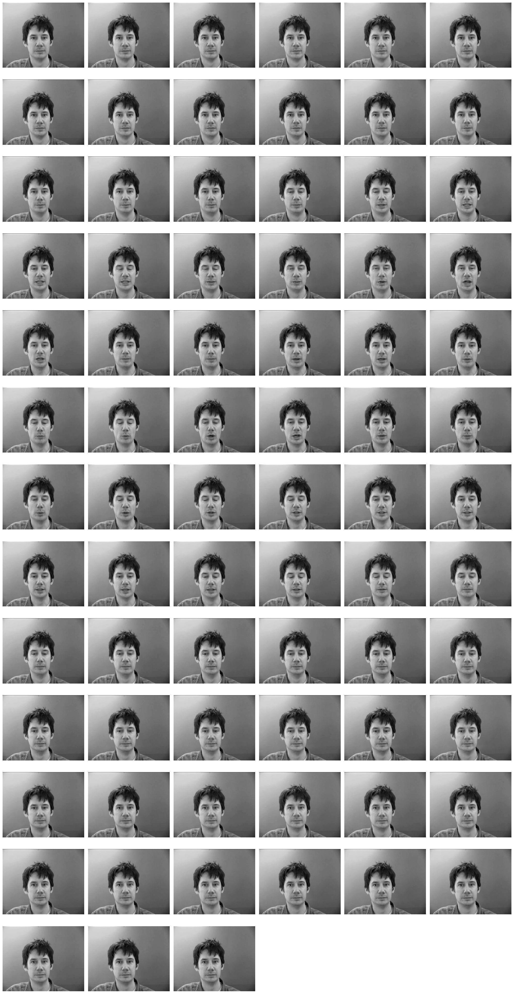

In [ ]:
video_path = '/content/data/s1/pwby1a.mpg'
display_frames_in_grid(video_path)

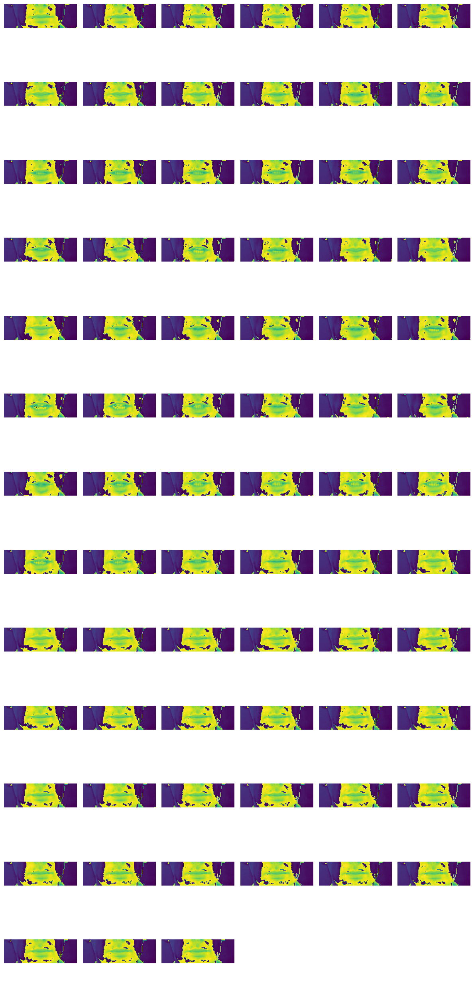

In [ ]:
plot_frames_grid(sample1s[0]) #framecrop


###The real sentence read by the speaker

In [ ]:
real_text_tensor = tf.strings.reduce_join([num_to_char(word) for word in sample1s[1]]).numpy()  # This extracts the byte string
real_text1 = real_text_tensor.decode('utf-8')  # This decodes the byte string into a regular Python string
print("REAL TEXT:", real_text1)


REAL TEXT:  place white by y one again


###Passing it to the model and get the predictions

In [ ]:
yhatt = model.predict(tf.expand_dims(sample1s[0], axis=0))
decoded1 = tf.keras.backend.ctc_decode(yhatt, input_length=[75], greedy=True)[0][0].numpy()
prediction_tensor = tf.strings.reduce_join([num_to_char(word) for word in decoded1]).numpy()
prediction_text1 = prediction_tensor.decode('utf-8')

print('PREDICTION-------')
print(prediction_text1)




1/1 [==============================] - 0s 148ms/step
PREDICTION-------
place wite y y one again


In [ ]:
calculate_wer(real_text1, prediction_text1)

0.3333333333333333

#Testing on own video

###Modify the load data function to work for own video

In [ ]:
def load_data(video_file_path: str, alignment_file_path: str):
    # Convert tensors to strings
    video_file_path = video_file_path.numpy().decode('utf-8')
    alignment_file_path = alignment_file_path.numpy().decode('utf-8')

    # Paths for video and alignment files
    video_full_path = os.path.join(DATA_DIR, video_file_path)
    alignment_full_path = os.path.join(ALIGNMENTS_DIR, alignment_file_path)

    # Initialize video capture
    video_capture = cv2.VideoCapture(video_full_path)
    video_frames = []
    total_frames = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))

    # Process each frame
    for _ in range(total_frames):
        success, frame = video_capture.read()
        if not success:
            break  # Exit loop if no frame is returned
        frame = tf.image.rgb_to_grayscale(frame)
        cropped_frame = frame[190:236, 80:220, :]  # framecrop
        #cropped_frame = frame[170:216, 120:260, :]
        video_frames.append(cropped_frame)
    video_capture.release()

    # Calculate frame statistics and normalize
    frames_mean = tf.math.reduce_mean(video_frames)
    frames_std = tf.math.reduce_std(tf.cast(video_frames, tf.float32))
    normalized_frames = tf.cast((video_frames - frames_mean), tf.float32) / frames_std

    # Load and process alignments
    alignment_tokens = []
    with open(alignment_full_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts and parts[2] != 'sil':
                alignment_tokens.extend(' ' + parts[2])
    alignment_tensor = tf.strings.unicode_split(''.join(alignment_tokens), 'UTF-8')
    processed_alignments = char_to_num(alignment_tensor)

    return normalized_frames, processed_alignments

In [ ]:
sample3 = load_data(tf.convert_to_tensor('/content/tv4.mov'),tf.convert_to_tensor('/content/tv4.align'))#framecrop

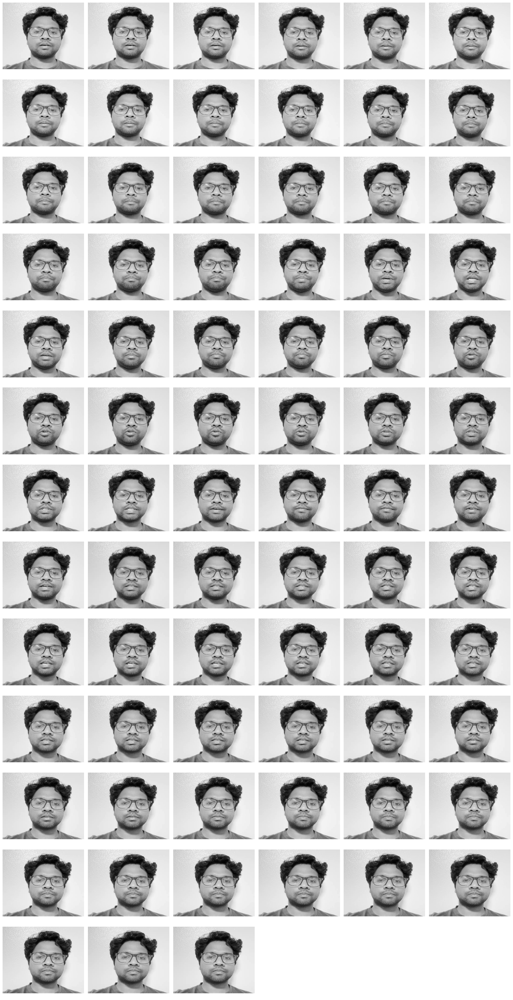

In [ ]:
video_path3 = '/content/tv4.mov'

display_frames_in_grid(video_path3)

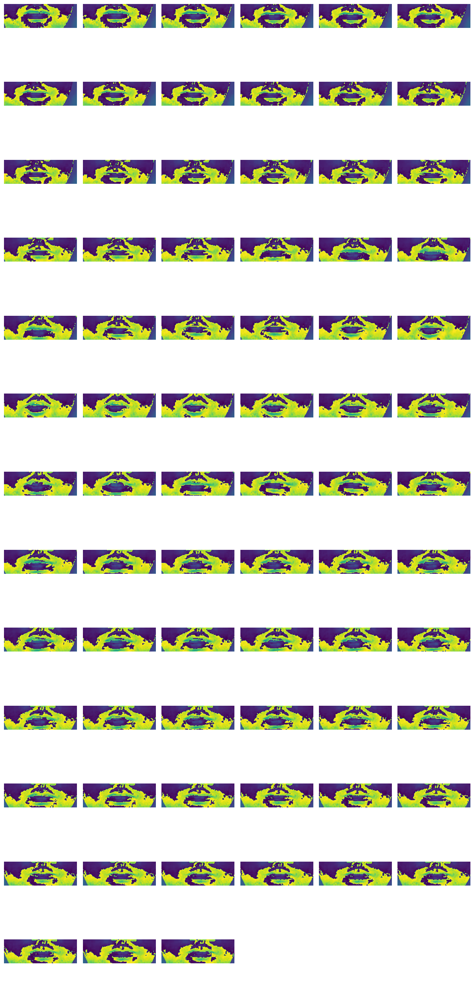

In [ ]:
plot_frames_grid(sample3[0]) #framecrop


In [ ]:
print('REAL TEXT---')
real_text_tensor = tf.strings.reduce_join([num_to_char(word) for word in sample3[1]]).numpy()  # This extracts the byte string
real_text = real_text_tensor.decode('utf-8')  # This decodes the byte string into a regular Python string
print("REAL TEXT:", real_text)


REAL TEXT---
REAL TEXT:  bin blue seven six


In [ ]:

yhat3 = model.predict(tf.expand_dims(sample3[0], axis=0))
decoded3 = tf.keras.backend.ctc_decode(yhat3, input_length=[75], greedy=True)[0][0].numpy()
# Assuming 'decoded3' is an array of numerical predictions from the model


# Assuming 'decoded3' is a single numerical prediction from the model
prediction_tensor = tf.strings.reduce_join([num_to_char(word) for word in decoded3]).numpy()
prediction_text = prediction_tensor.decode('utf-8')

print('PREDICTION-------')
print(prediction_text)



1/1 [==============================] - 0s 318ms/step
PREDICTION-------
bin re win n ie naon


#Calculate the Word error rate for our actual and predicted text

In [ ]:
calculate_wer(real_text, prediction_text)

1.25

In [ ]:
pip install jiwer


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 13.0 MB/s eta 0:00:00


In [ ]:
import jiwer

def calculate_wer(true_text, pred_text):
    """
    Calculate the Word Error Rate (WER) between true text and predicted text.

    Parameters:
    - true_text (str): The correct transcription of the speech.
    - pred_text (str): The transcription predicted by the speech recognition model.

    Returns:
    - float: The computed Word Error Rate.
    """
    # Define the transformation to preprocess the texts
    transformation = jiwer.Compose([
        jiwer.ToLowerCase(),
        jiwer.RemoveMultipleSpaces(),
        jiwer.RemovePunctuation(),
        jiwer.Strip()
    ])

    # Apply transformation to both true and predicted texts
    true_text_transformed = transformation(true_text)
    pred_text_transformed = transformation(pred_text)

    # Calculate WER
    wer = jiwer.wer(true_text_transformed, pred_text_transformed)
    return wer

#Could not train on own data due to time limitations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 35.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.1/267.1 kB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.8 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>